In [1]:
import numpy as np
import pandas as pd
import missingno as misno
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
import sweetviz as sv
from sklearn.impute import SimpleImputer
import sweetviz as sv
from catboost import CatBoostClassifier
import catboost
from sklearn.model_selection import train_test_split, GridSearchCV
import category_encoders as ce
from imblearn.combine import SMOTETomek
import sklearn.metrics as skm
import joblib

Imported AutoViz_Class version: 0.1.23. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Note: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.


**Importing the code and performing EDA**

In [2]:
df = pd.read_csv(r"C:\Users\Dell\Desktop\ML course\Income_Inequality_Prediction_Project2\Dataset\Inequality Prediction Dataset.csv")
df_copy = df.copy()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 43 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              209499 non-null  object 
 1   age                             209499 non-null  int64  
 2   gender                          209499 non-null  object 
 3   education                       209499 non-null  object 
 4   class                           104254 non-null  object 
 5   education_institute             13302 non-null   object 
 6   marital_status                  209499 non-null  object 
 7   race                            209499 non-null  object 
 8   is_hispanic                     209499 non-null  object 
 9   employment_commitment           209499 non-null  object 
 10  unemployment_reason             6520 non-null    object 
 11  employment_stat                 209499 non-null  int64  
 12  wage_per_hour   

**Columns have less than 25% of non null values, similar or ID type would be removed**

*Remove education_institute as it has many null values and is a repeat of education*

*Remove unemployment_reason*

*Remove is_labor_union,veterans_questionnaire,migration_prev_sunbelt,residence_1_year, old_residence_reg, _state*

*Based on employment_commitment, half of them are unemployed*

*Columns AK and AL are almost the same, removing AK*

*Remove industry_code and occupation_code as they are duplicates of their respective main*



In [6]:
df.shape

(209499, 43)

In [7]:
# Inlcludes all data types except int and float
df.describe(include=['O']).T

,count,unique,top,freq
ID,209499,209499,ID_TZ119726,1
gender,209499,2,Female,108784
education,209499,17,High school graduate,50627
class,104254,8,Private,75617
education_institute,13302,2,High school,7247
marital_status,209499,7,Never married,90723
race,209499,5,White,175709
is_hispanic,209499,10,All other,180404
employment_commitment,209499,8,Children or Armed Forces,129789
unemployment_reason,6520,5,Other job loser,2242


**Check for duplicates, missing and unknown values**

In [3]:
df = df.drop(columns = ['old_residence_reg','old_residence_state','is_labor_union', 'veterans_admin_questionnaire','unemployment_reason','is_labor_union','education_institute','under_18_family','migration_prev_sunbelt','residence_1_year_ago','migration_code_move_within_reg','ID','industry_code','occupation_code'])

In [5]:
df.shape

(209499, 30)

In [6]:
df = df.replace(' ?',np.NaN)

<AxesSubplot:>

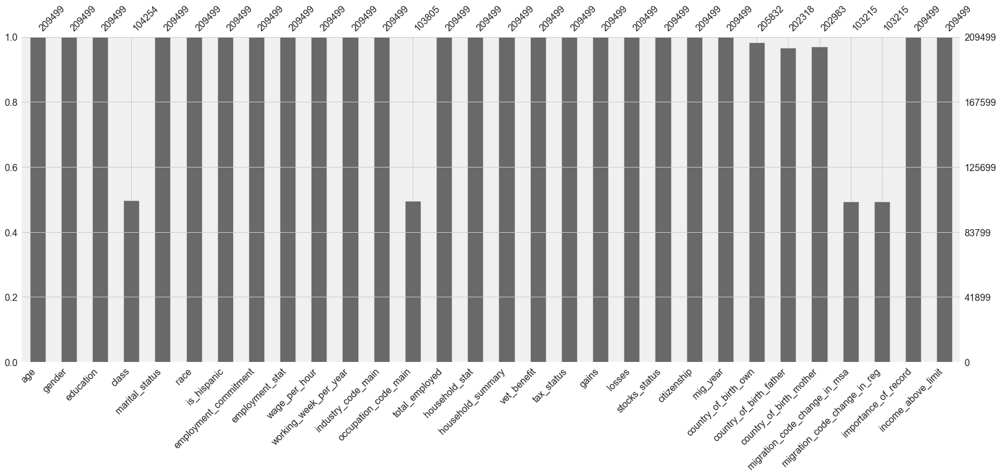

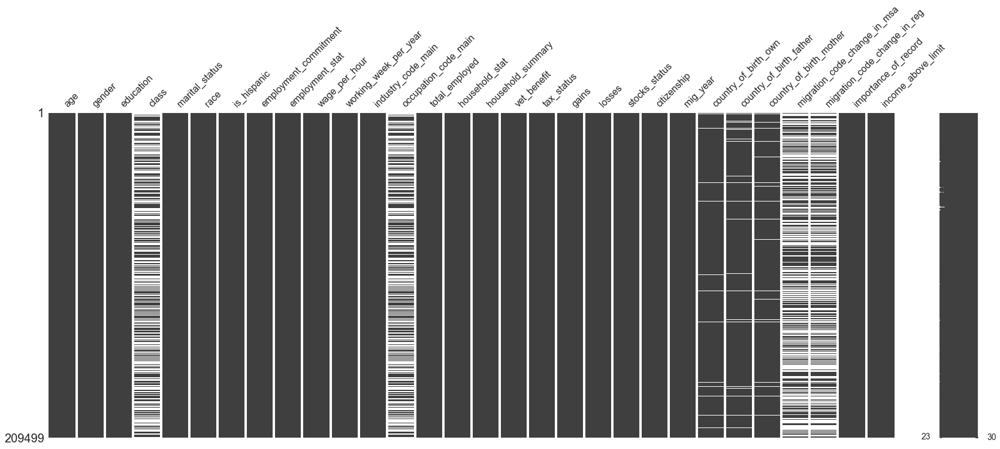

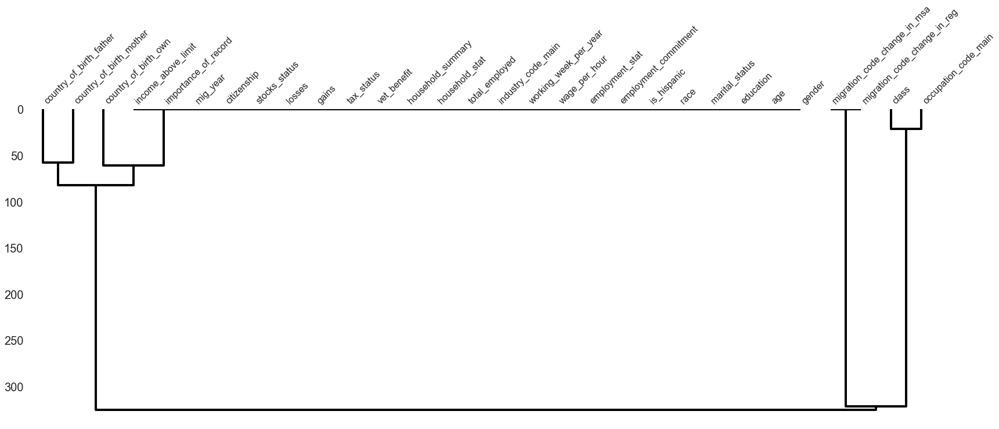

In [19]:
%matplotlib inline
misno.bar(df)
misno.matrix(df)
misno.dendrogram(df)

In [7]:
# pd.DataFrame(impute.fit_transform(df)) will make you lose the column labels and dtypes, hence mention them back explicitly
# cant use dtype paramater in DataFrame as it convert to only one dtype
impute = SimpleImputer(strategy = 'most_frequent')
df = pd.DataFrame(impute.fit_transform(df), columns = df.columns).astype(df.dtypes.to_dict())

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 30 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   age                           209499 non-null  int64  
 1   gender                        209499 non-null  object 
 2   education                     209499 non-null  object 
 3   class                         209499 non-null  object 
 4   marital_status                209499 non-null  object 
 5   race                          209499 non-null  object 
 6   is_hispanic                   209499 non-null  object 
 7   employment_commitment         209499 non-null  object 
 8   employment_stat               209499 non-null  int64  
 9   wage_per_hour                 209499 non-null  int64  
 10  working_week_per_year         209499 non-null  int64  
 11  industry_code_main            209499 non-null  object 
 12  occupation_code_main          209499 non-nul

In [9]:
# Removing duplicated rows
duplicate_rows = df.duplicated()
duplicated_index = df[df.duplicated() == True].index
df = df.drop(index = duplicated_index)
df.duplicated().sum()

0

In [12]:
av = AutoViz_Class()

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 30)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    29 Predictors classified...
        4 variables removed since they were ID or low-information variables
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Binary_Classification VISUALIZATION Started #####################


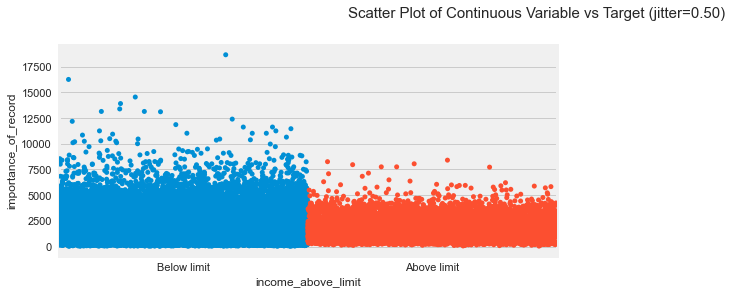

Could not draw Distribution Plots


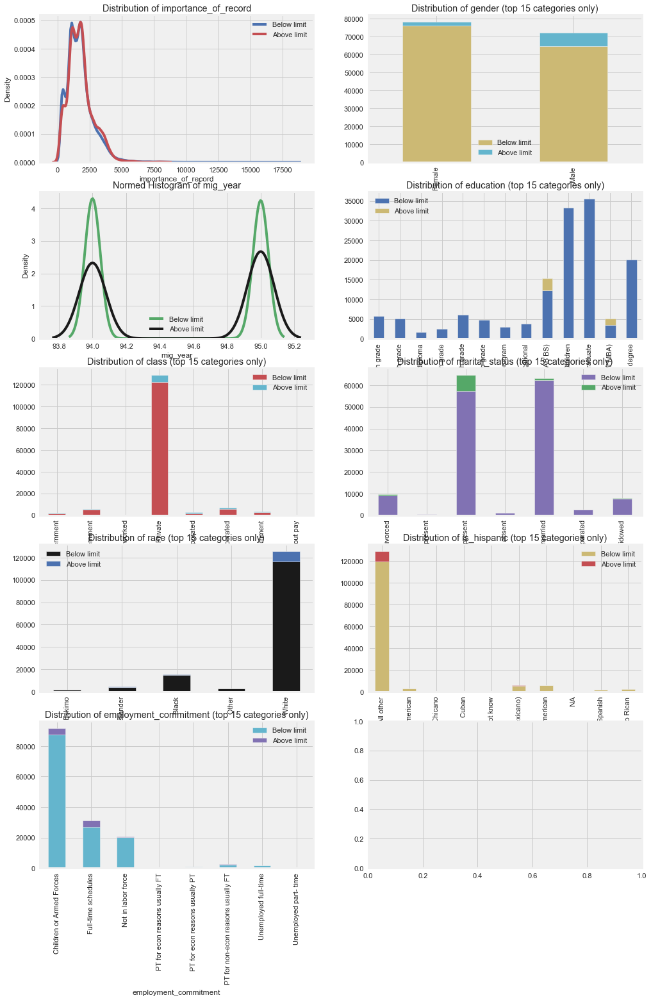

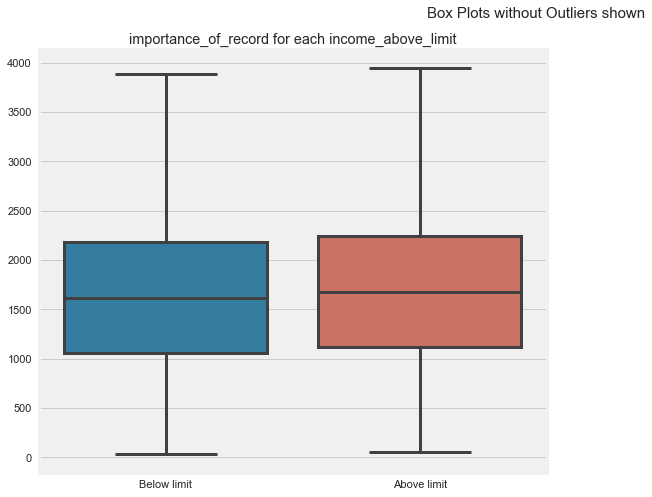

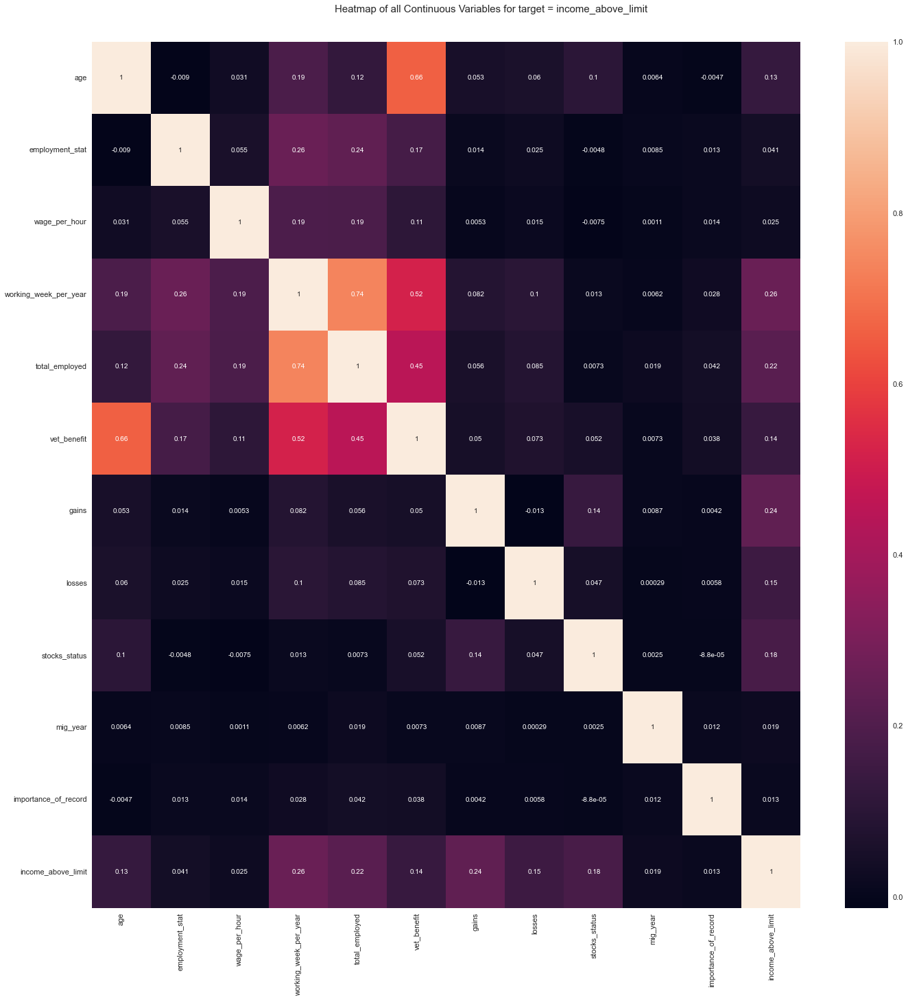

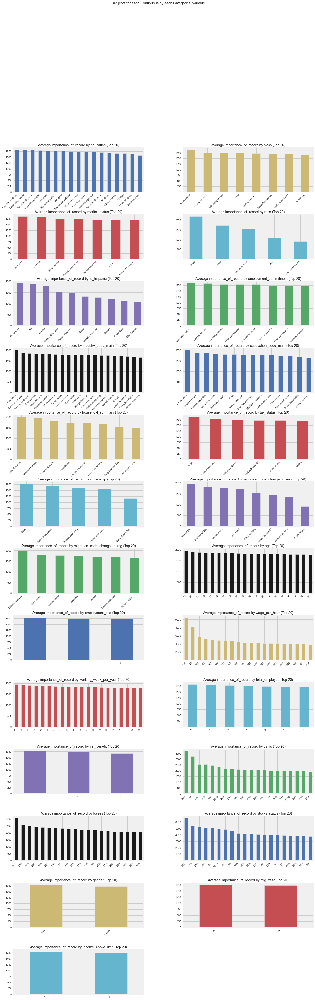

Time to run AutoViz (in seconds) = 154

 ###################### VISUALIZATION Completed ########################


In [13]:
df = av.AutoViz(filename = "",depVar = 'income_above_limit', dfte = df)

In [14]:
# To check if any columns are removed automatically by av
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150000 entries, 2490 to 165650
Data columns (total 26 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   age                           150000 non-null  int64  
 1   gender                        150000 non-null  object 
 2   education                     150000 non-null  object 
 3   class                         150000 non-null  object 
 4   marital_status                150000 non-null  object 
 5   race                          150000 non-null  object 
 6   is_hispanic                   150000 non-null  object 
 7   employment_commitment         150000 non-null  object 
 8   employment_stat               150000 non-null  int64  
 9   wage_per_hour                 150000 non-null  int64  
 10  working_week_per_year         150000 non-null  int64  
 11  industry_code_main            150000 non-null  object 
 12  occupation_code_main          150000 non-

In [ ]:
Observations occuring frequently:
	1. Working in private sector
	2. Married and having a living partner, probably greater financial burden
	3. Whites or natives, hence non-Hispanics
	4. Employment statistical level is 0
	5. Administrative jobs
	6. Getting veterans benefits, links to where employment was committed for Armed Forces
	7. Migrated in 1994-1995
    8. Migration code remains unchanged in MSA or reg
    9. Importance of record is above 4000
Target variable

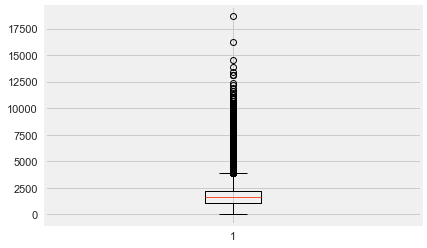

In [16]:
# Remove outliers
plt.boxplot(df['importance_of_record'])
df[df['importance_of_record']>13000]
df = df.drop(index = [166457,193518,36721,163001,59847,194012,203766,170960])

In [17]:
df.shape

(149992, 26)

In [19]:
# Encode before using SMOTETomek, load the values into a dictionary in case you want to refer to values
encoder = ce.OrdinalEncoder()

In [20]:
df = encoder.fit_transform(df)

In [21]:
df_copy

,ID,age,gender,education,class,education_institute,marital_status,race,is_hispanic,employment_commitment,...,country_of_birth_mother,migration_code_change_in_msa,migration_prev_sunbelt,migration_code_move_within_reg,migration_code_change_in_reg,residence_1_year_ago,old_residence_reg,old_residence_state,importance_of_record,income_above_limit
0,ID_TZ0000,79,Female,High school graduate,NaN,NaN,Widowed,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,1779.74,Below limit
1,ID_TZ0001,65,Female,High school graduate,NaN,NaN,Widowed,White,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,2366.75,Below limit
2,ID_TZ0002,21,Male,12th grade no diploma,Federal government,NaN,Never married,Black,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1693.42,Below limit
3,ID_TZ0003,2,Female,Children,NaN,NaN,Never married,Asian or Pacific Islander,All other,Children or Armed Forces,...,India,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1380.27,Below limit
4,ID_TZ0004,70,Male,High school graduate,NaN,NaN,Married-civilian spouse present,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,1580.79,Below limit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209494,ID_TZ99995,16,Female,7th and 8th grade,NaN,High school,Never married,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,2170.60,Below limit
209495,ID_TZ99996,78,Male,Bachelors degree(BA AB BS),NaN,NaN,Married-civilian spouse present,White,All other,Not in labor force,...,Canada,?,?,?,?,NaN,NaN,NaN,1029.57,Below limit
209496,ID_TZ99997,8,Female,Children,NaN,NaN,Never married,White,All other,Children or Armed Forces,...,US,?,?,?,?,NaN,NaN,NaN,791.61,Below limit
209497,ID_TZ99998,26,Female,Some college but no degree,Private,NaN,Married-civilian spouse present,White,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,3530.26,Below limit


In [22]:
df

,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,...,tax_status,gains,losses,stocks_status,citizenship,mig_year,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit
2490,7,1,1,1,1,1,1,1,0,0,...,1,0,0,0,1,94,1,1,2415.32,0
42050,16,1,2,1,1,2,1,2,0,0,...,1,0,0,0,1,95,1,1,1814.95,0
158263,60,2,3,2,2,2,1,3,0,0,...,2,0,0,0,1,95,1,1,1498.37,0
48126,20,1,3,1,1,3,1,4,2,680,...,3,0,0,0,2,95,1,1,3130.05,0
142672,1,2,1,1,1,2,1,1,0,0,...,1,0,0,0,1,94,1,1,2167.91,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204292,57,2,3,1,2,2,1,1,0,1150,...,4,0,0,0,1,94,1,1,1410.56,0
55505,33,2,3,1,2,2,1,1,0,0,...,4,0,0,0,1,94,1,1,3717.73,0
25169,33,1,6,1,2,1,1,1,0,0,...,4,0,0,0,1,94,1,1,1452.73,0
145357,29,2,6,1,2,2,2,1,0,0,...,4,0,0,0,2,94,1,1,697.40,0


Shape of your Data Set loaded: (149992, 26)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    25 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification VISUALIZATION Started #####################


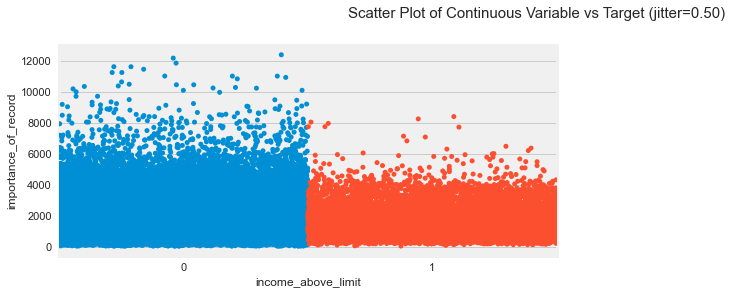

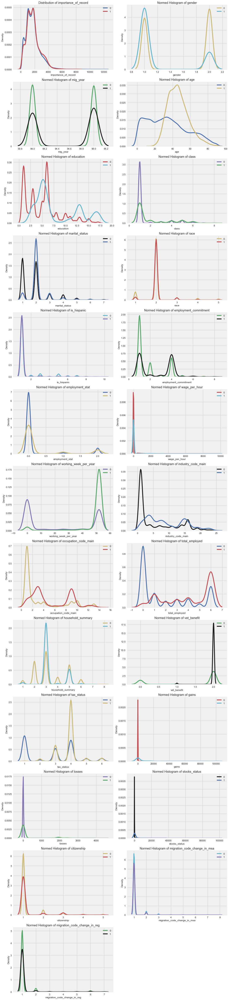

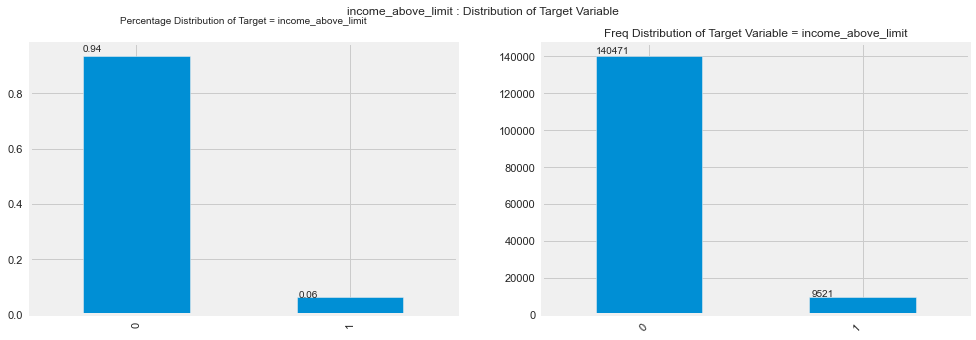

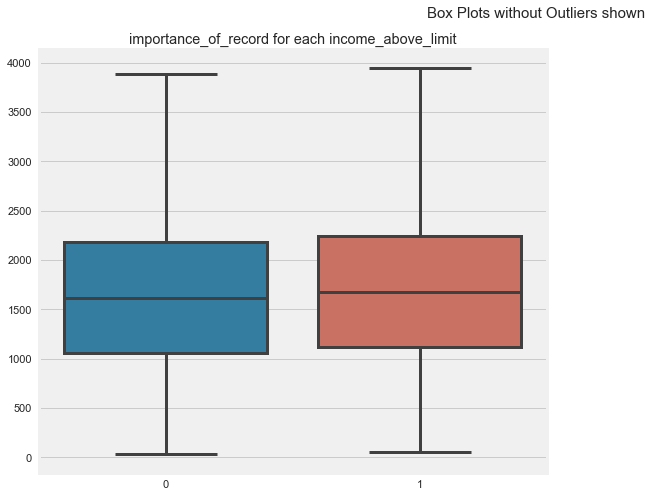

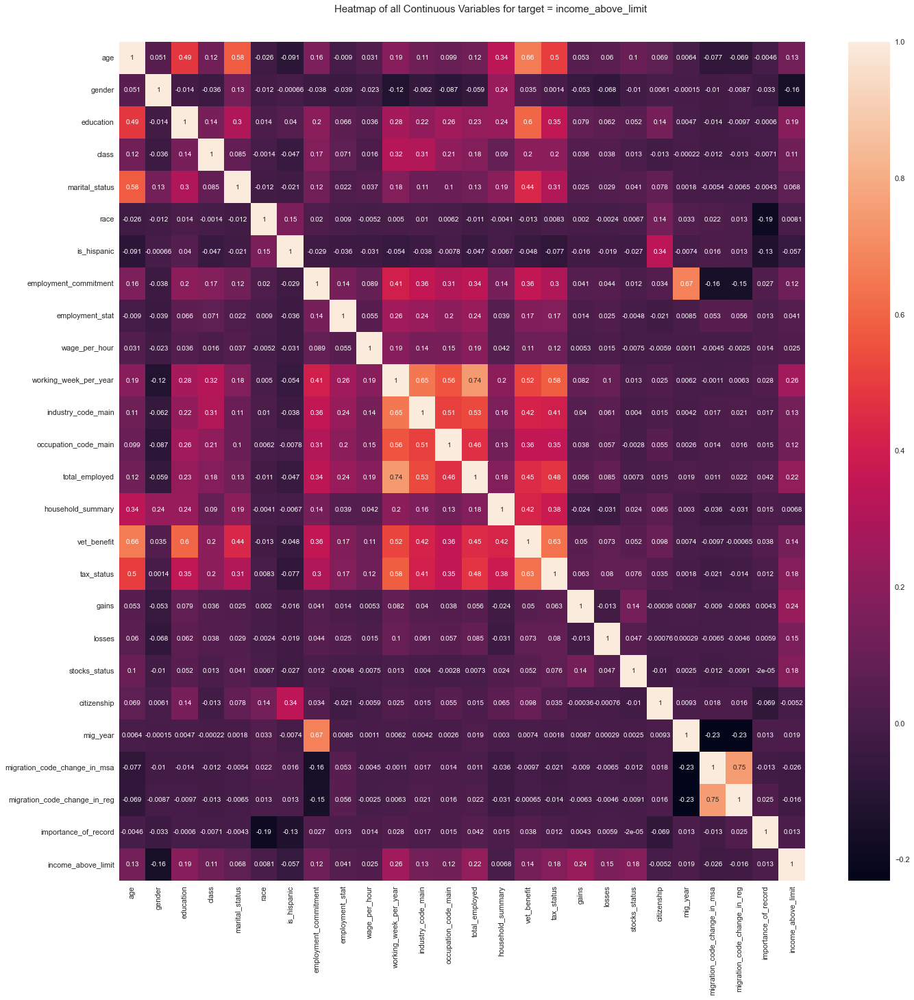

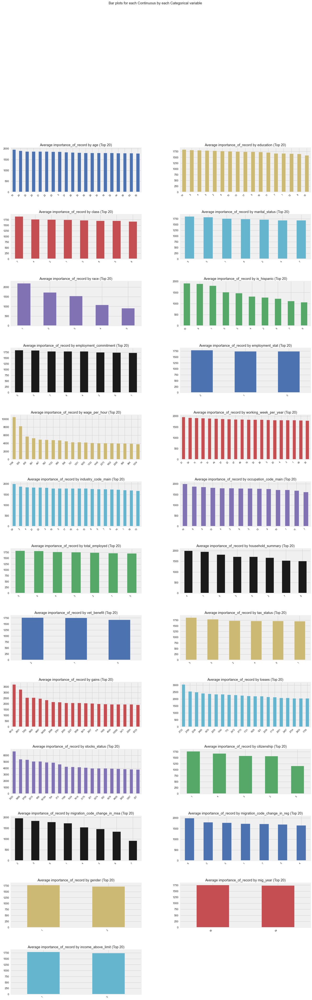

Time to run AutoViz (in seconds) = 166

 ###################### VISUALIZATION Completed ########################


In [23]:
df = av.AutoViz('',depVar = 'income_above_limit', dfte = df)

In [351]:
All are below income limit attributes: 
1. stock_status < 40000
2. Occupation is private household services
3. Children or Secondary individual living in group quarters
4. Getting veterans benefits
5. No losses and no gains
6. Migration code doesn't change
7. Working week per year is 52
8. Very high gains (100000) for those not born in US or migrants
9. Occupation is professional (code=4, code_main is 9) AND couples paying tax below 65 years (tax_status = 4)
10. Single tax payers (tax_status = 3)
11. industry_code is 3 or 5

SyntaxError: invalid syntax (3595143800.py, line 1)

In [26]:
df.shape

(149649, 26)

In [25]:
duplicate_rows = df.duplicated()
duplicated_index = df[df.duplicated() == True].index
df = df.drop(index = duplicated_index)
df.duplicated().sum()

0

((149649, 25), (149649,))

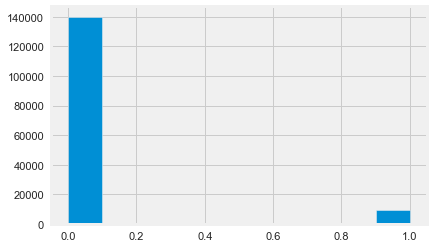

In [27]:
# Target variable balancing
plt.hist(df['income_above_limit'])
y = df['income_above_limit']
X = df.drop(columns = 'income_above_limit')
st = SMOTETomek(sampling_strategy = 'auto')
X.shape, y.shape

In [28]:
X_smt, y_smt = st.fit_resample(X,y)

(array([139252.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 139252.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

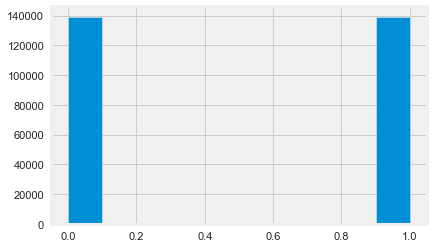

In [29]:
# Target class is balanced
plt.hist(y_smt)

In [30]:
# Model evaluation using catboost
# Using Pool data set drastically improves the performance
cb = CatBoostClassifier()

In [60]:
# cat_features need to be passed as a list of indices after the declaration
categorical_columns = df_copy.describe(include = ['O']).drop(columns = ['country_of_birth_father', 'household_stat', 'old_residence_state', 'income_above_limit', 'veterans_admin_questionnaire', 'country_of_birth_own', 'is_labor_union', 'ID', 'migration_prev_sunbelt', 'residence_1_year_ago', 'migration_code_move_within_reg', 'unemployment_reason', 'country_of_birth_mother', 'under_18_family', 'old_residence_reg', 'education_institute']).columns
X_smt[categorical_columns] = X_smt[categorical_columns].astype('category')
X_smt[categorical_columns].describe(include = 'category').columns
cat_features_list = X_smt.columns.get_indexer(categorical_columns)
cat_features_list
#[1,2,3,4,5,6,7,12,14,16,18,23,25,25]

array([ 1,  2,  3,  4,  5,  6,  7, 11, 12, 14, 16, 20, 22, 23],
      dtype=int64)

In [61]:
X_train,X_test,y_train,y_test = train_test_split (X_smt,y_smt,test_size = 0.3,random_state = 42)

In [62]:
# By default the no. of iterations is 1000, model has overfitted if resulting iterations > fitted values (which is 1000 here)
cb.fit(X_train,y_train, cat_features = cat_features_list)

Learning rate set to 0.097889
0:	learn: 0.5597023	total: 887ms	remaining: 14m 46s
1:	learn: 0.4811996	total: 1.61s	remaining: 13m 24s
2:	learn: 0.4212089	total: 2.3s	remaining: 12m 44s
3:	learn: 0.3811957	total: 2.82s	remaining: 11m 41s
4:	learn: 0.3460925	total: 3.45s	remaining: 11m 26s
5:	learn: 0.3234638	total: 4.1s	remaining: 11m 19s
6:	learn: 0.3067899	total: 4.77s	remaining: 11m 16s
7:	learn: 0.2916754	total: 5.33s	remaining: 11m 1s
8:	learn: 0.2803218	total: 5.95s	remaining: 10m 55s
9:	learn: 0.2675139	total: 6.63s	remaining: 10m 56s
10:	learn: 0.2569117	total: 7.21s	remaining: 10m 48s
11:	learn: 0.2497498	total: 7.85s	remaining: 10m 46s
12:	learn: 0.2402754	total: 8.5s	remaining: 10m 45s
13:	learn: 0.2352160	total: 9.18s	remaining: 10m 46s
14:	learn: 0.2282280	total: 9.77s	remaining: 10m 41s
15:	learn: 0.2233683	total: 10.4s	remaining: 10m 38s
16:	learn: 0.2178886	total: 11s	remaining: 10m 33s
17:	learn: 0.2102805	total: 11.5s	remaining: 10m 24s
18:	learn: 0.2069276	total: 12.1

In [ ]:
# AVOID Hypertuning takes a lot of time to increase the training speed (Increasing learning rate when iterations reduce), border_count ideal value = 254 if running on CPU
# cb.fit(X_train,y_train, cat_features = cat_features_list)
grid = {'iterations': [900,950], 'learning_rate': [0.078,0.077], 'boosting_type': ['Ordered','Plain']}
grid_cb = GridSearchCV(estimator = cb, param_grid = grid, scoring = 'accuracy')
grid_cb.fit(X_train, y_train, cat_features = cat_features_list)

0:	learn: 0.6321865	total: 486ms	remaining: 7m 16s
1:	learn: 0.5860437	total: 1.01s	remaining: 7m 33s
2:	learn: 0.5490119	total: 1.52s	remaining: 7m 35s
3:	learn: 0.5186060	total: 1.96s	remaining: 7m 19s
4:	learn: 0.4954406	total: 2.42s	remaining: 7m 12s
5:	learn: 0.4661581	total: 2.86s	remaining: 7m 6s
6:	learn: 0.4442709	total: 3.32s	remaining: 7m 3s
7:	learn: 0.4253850	total: 3.8s	remaining: 7m 3s
8:	learn: 0.4104706	total: 4.28s	remaining: 7m 3s
9:	learn: 0.4006789	total: 4.81s	remaining: 7m 7s
10:	learn: 0.3900736	total: 5.26s	remaining: 7m 5s
11:	learn: 0.3813431	total: 5.77s	remaining: 7m 6s
12:	learn: 0.3738518	total: 6.27s	remaining: 7m 7s
13:	learn: 0.3667204	total: 6.72s	remaining: 7m 5s
14:	learn: 0.3611694	total: 7.25s	remaining: 7m 7s
15:	learn: 0.3559475	total: 7.72s	remaining: 7m 6s
16:	learn: 0.3488853	total: 8.23s	remaining: 7m 7s
17:	learn: 0.3428492	total: 8.74s	remaining: 7m 8s
18:	learn: 0.3391250	total: 9.27s	remaining: 7m 9s
19:	learn: 0.3358162	total: 9.81s	rem

In [63]:
y_pred = cb.predict(X_test)

In [64]:
print (skm.classification_report(y_test, y_pred, output_dict = True, target_names = ['Below income limit', 'Above income limit']))
print ('The accuracy before hyperparamter tuning is ',skm.accuracy_score(y_test, y_pred))

{'Below income limit': {'precision': 0.9563033651431442, 'recall': 0.9601383152434925, 'f1-score': 0.9582170031753641, 'support': 41644}, 'Above income limit': {'precision': 0.960230947988788, 'recall': 0.9564045051064236, 'f1-score': 0.9583139069205848, 'support': 41908}, 'accuracy': 0.9582655112983531, 'macro avg': {'precision': 0.9582671565659662, 'recall': 0.9582714101749581, 'f1-score': 0.9582654550479744, 'support': 83552}, 'weighted avg': {'precision': 0.9582733615752491, 'recall': 0.9582655112983531, 'f1-score': 0.9582656081417885, 'support': 83552}}
The accuracy before hyperparamter tuning is  0.9582655112983531


In [65]:
cb.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'Logloss',
 'combinations_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1',
  'Counter:CtrBorderCount=15:CtrBorderType=Uniform:Prior=0/1'],
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'fold_permutation_block': 0,
 'leaf_estimation_method': 'Newton',
 'counter_calc_method': 'SkipTest',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'ctr_leaf_count_limit': 18446744073709551615,
 'bayesian_matrix_reg': 0.10000000149011612,
 'one_hot_max_size': 2,
 'eval_fraction': 0,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': False,
 'max_ctr_complexity': 4,
 'model_size_reg': 0.5,
 'simple_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=Min

In [66]:
imp_features = cb.get_feature_importance()
print(type(imp_features), '\n',imp_features)

<class 'numpy.ndarray'> 
 [ 6.98473434  4.7175274   5.42253047  2.62156396  5.26859408  0.542488
  0.78470283 15.51692336  1.03096194  0.77133427  4.27669447  4.97700756
  5.39966377  3.57283104  3.15424964  0.73063401  6.28931347  3.63932195
  1.55220098  3.69744196  0.8282222  12.79502657  2.05997183  0.68006083
  2.68599906]


In [72]:
imp_features[imp_features>4]

array([ 6.98473434,  4.7175274 ,  5.42253047,  5.26859408, 15.51692336,
        4.27669447,  4.97700756,  5.39966377,  6.28931347, 12.79502657])

In [73]:
imp_features

array([ 6.98473434,  4.7175274 ,  5.42253047,  2.62156396,  5.26859408,
        0.542488  ,  0.78470283, 15.51692336,  1.03096194,  0.77133427,
        4.27669447,  4.97700756,  5.39966377,  3.57283104,  3.15424964,
        0.73063401,  6.28931347,  3.63932195,  1.55220098,  3.69744196,
        0.8282222 , 12.79502657,  2.05997183,  0.68006083,  2.68599906])

In [75]:
X_train.shape

(194952, 25)

In [76]:
Select only those features whose contribution is more than 4
set(zip(X_train.columns,imp_features))

{('age', 6.984734338804681),
 ('citizenship', 0.8282221962550693),
 ('class', 2.621563962015449),
 ('education', 5.422530473235029),
 ('employment_commitment', 15.516923364024066),
 ('employment_stat', 1.03096194279688),
 ('gains', 3.639321950090371),
 ('gender', 4.7175274018106075),
 ('household_summary', 3.154249638425693),
 ('importance_of_record', 2.685999064562754),
 ('industry_code_main', 4.977007558799533),
 ('is_hispanic', 0.7847028322958232),
 ('losses', 1.5522009822726808),
 ('marital_status', 5.268594082490183),
 ('mig_year', 12.795026572145042),
 ('migration_code_change_in_msa', 2.0599718277490617),
 ('migration_code_change_in_reg', 0.680060831065374),
 ('occupation_code_main', 5.399663767350656),
 ('race', 0.5424879956317049),
 ('stocks_status', 3.6974419583638385),
 ('tax_status', 6.289313472249551),
 ('total_employed', 3.5728310379923935),
 ('vet_benefit', 0.7306340091712255),
 ('wage_per_hour', 0.7713342719123466),
 ('working_week_per_year', 4.276694468489946)}

In [77]:
X_new = X_smt[['age','education','employment_commitment','gender','industry_code_main','marital_status','mig_year','occupation_code_main','tax_status','working_week_per_year']]

In [78]:
X_new_train, X_new_test, y_new_train, y_new_test = train_test_split(X_new, y_smt, test_size = 0.3, random_state = 42)

In [79]:
X_new_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 194952 entries, 51760 to 121958
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   age                    194952 non-null  int64   
 1   education              194952 non-null  category
 2   employment_commitment  194952 non-null  category
 3   gender                 194952 non-null  category
 4   industry_code_main     194952 non-null  category
 5   marital_status         194952 non-null  category
 6   mig_year               194952 non-null  int64   
 7   occupation_code_main   194952 non-null  category
 8   tax_status             194952 non-null  category
 9   working_week_per_year  194952 non-null  int64   
dtypes: category(7), int64(3)
memory usage: 7.3 MB


In [80]:
cb.fit(X_new_train,y_new_train, cat_features = [1,2,3,4,5,7,8])

Learning rate set to 0.097889
0:	learn: 0.5829156	total: 481ms	remaining: 8m
1:	learn: 0.5043146	total: 911ms	remaining: 7m 34s
2:	learn: 0.4291489	total: 1.34s	remaining: 7m 24s
3:	learn: 0.3916848	total: 1.77s	remaining: 7m 20s
4:	learn: 0.3537546	total: 2.17s	remaining: 7m 12s
5:	learn: 0.3316219	total: 2.45s	remaining: 6m 45s
6:	learn: 0.3151234	total: 2.78s	remaining: 6m 34s
7:	learn: 0.3043722	total: 3.06s	remaining: 6m 20s
8:	learn: 0.2883907	total: 3.38s	remaining: 6m 11s
9:	learn: 0.2765026	total: 3.68s	remaining: 6m 4s
10:	learn: 0.2662138	total: 4.01s	remaining: 6m
11:	learn: 0.2587226	total: 4.27s	remaining: 5m 51s
12:	learn: 0.2519729	total: 4.6s	remaining: 5m 49s
13:	learn: 0.2464909	total: 4.95s	remaining: 5m 48s
14:	learn: 0.2382532	total: 5.27s	remaining: 5m 45s
15:	learn: 0.2335922	total: 5.59s	remaining: 5m 43s
16:	learn: 0.2279735	total: 5.95s	remaining: 5m 44s
17:	learn: 0.2244465	total: 6.26s	remaining: 5m 41s
18:	learn: 0.2185022	total: 6.55s	remaining: 5m 38s
19

In [81]:
y_new_pred = cb.predict(X_new_test)
print (skm.classification_report(y_new_test, y_new_pred, output_dict = True, target_names = ['Below income limit', 'Above income limit']))
print ('The accuracy after extracting main features is ',skm.accuracy_score(y_test, y_pred))

{'Below income limit': {'precision': 0.9336744545279011, 'recall': 0.9289213332052637, 'f1-score': 0.9312918291684723, 'support': 41644}, 'Above income limit': {'precision': 0.929724596391263, 'recall': 0.9344277942159015, 'f1-score': 0.9320702622935212, 'support': 41908}, 'accuracy': 0.9316832631175794, 'macro avg': {'precision': 0.9316995254595821, 'recall': 0.9316745637105825, 'f1-score': 0.9316810457309967, 'support': 83552}, 'weighted avg': {'precision': 0.9316932852585811, 'recall': 0.9316832631175794, 'f1-score': 0.9316822755420427, 'support': 83552}}
The accuracy after extracting main features is  0.9582655112983531


In [82]:
joblib.dump(cb,'catboost_model.joblib')

['catboost_model.joblib']

In [83]:
cb = joblib.load('catboost_model.joblib')

In [84]:
target_predictions = cb.predict(X_new_test)
target_predictions

array([1, 0, 0, ..., 0, 1, 1], dtype=int64)

In [86]:
# Example of encoding while analyzing st results
array1 = df_copy['gender'].unique()
array2 = X_new_train['gender'].unique()
gender_dict = {array2[i]:array1[i] for i in range(len(array1))}
print (gender_dict,'\n')

array1 = df_copy['employment_commitment'].unique()
array2 = X_new_train['employment_commitment'].unique()
emp_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (emp_dict,'\n')

array1 = df_copy['industry_code_main'].unique()
array2 = X_new_train['industry_code_main'].unique()
ind_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (ind_dict,'\n')

array1 = df_copy['marital_status'].unique()
array2 = X_new_train['marital_status'].unique()
mar_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (mar_dict,'\n')

array1 = df_copy['occupation_code_main'].unique()
array2 = X_new_train['occupation_code_main'].unique()
occ_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (occ_dict,'\n')

array1 = df_copy['tax_status'].unique()
array2 = X_new_train['tax_status'].unique()
tax_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (tax_dict,'\n')

array1 = df_copy['education'].unique()
array2 = X_new_train['education'].unique()
edu_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (edu_dict,'\n')

{1: ' Female', 2: ' Male'} 

{1: ' Not in labor force', 4: ' Children or Armed Forces', 3: ' Full-time schedules', 2: ' PT for econ reasons usually PT', 5: ' Unemployed full-time', 8: ' PT for non-econ reasons usually FT', 7: ' PT for econ reasons usually FT', 6: ' Unemployed part- time'} 

{2: ' Not in universe or children', 7: ' Hospital services', 20: ' Retail trade', 12: ' Finance insurance and real estate', 18: ' Manufacturing-nondurable goods', 1: ' Transportation', 14: ' Business and repair services', 15: ' Medical except hospital', 6: ' Education', 11: ' Construction', 16: ' Manufacturing-durable goods', 13: ' Public administration', 3: ' Agriculture', 4: ' Other professional services', 10: ' Mining', 9: ' Utilities and sanitary services', 19: ' Private household services', 8: ' Personal services except private HH', 5: ' Wholesale trade', 21: ' Communications', 17: ' Entertainment', 23: ' Social services', 22: ' Forestry and fisheries', 24: ' Armed Forces'} 

{2: ' Widowed', 1:

## Explainable AI ##

In [92]:
# Testing cb.predict([29,7,3,1,4,1,94,10,3,52])

1

In [ ]:
# Import train data with <500 observations as shap is complex
# Global interpretation is for all rows whereas local is for a particular row